In [1]:
# import the required libraries

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')


In [2]:
# loading the data files
df_train = pd.read_csv('/content/Temperature1_Train.csv')
df_test = pd.read_csv('/content/Temperature1_Test.csv')

In [3]:
# backup of the original files
otrain = df_train.copy()
otest = df_test.copy()


In [4]:
df_train

,date,temp,humidity,wind_speed,pressure
0,01/01/2013,10.000000,84.500000,0.000000,1015.666667
1,02/01/2013,7.400000,92.000000,2.980000,1017.800000
2,03/01/2013,7.166667,87.000000,4.633333,1018.666667
3,04/01/2013,8.666667,71.333333,1.233333,1017.166667
4,05/01/2013,6.000000,86.833333,3.700000,1016.500000
...,...,...,...,...,...
1456,27/12/2016,16.850000,67.550000,8.335000,1017.200000
1457,28/12/2016,17.217391,68.043478,3.547826,1015.565217
1458,29/12/2016,15.238095,87.857143,6.000000,1016.904762
1459,30/12/2016,14.095238,89.666667,6.266667,1017.904762


In [5]:
df_train.shape

(1461, 5)

In [6]:
df_train['date'].min()

'01/01/2013'

In [7]:
df_train['date'].max()

'31/12/2016'

In [8]:
df_train.head(15)

,date,temp,humidity,wind_speed,pressure
0,01/01/2013,10.000000,84.500000,0.000000,1015.666667
1,02/01/2013,7.400000,92.000000,2.980000,1017.800000
2,03/01/2013,7.166667,87.000000,4.633333,1018.666667
3,04/01/2013,8.666667,71.333333,1.233333,1017.166667
4,05/01/2013,6.000000,86.833333,3.700000,1016.500000
5,06/01/2013,7.000000,82.800000,1.480000,1018.000000
6,07/01/2013,7.000000,78.600000,6.300000,1020.000000
7,08/01/2013,8.857143,63.714286,7.142857,1018.714286
8,09/01/2013,14.000000,51.250000,12.500000,1017.000000
9,10/01/2013,11.000000,62.000000,7.400000,1015.666667


In [9]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1461 entries, 0 to 1460
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        1461 non-null   object 
 1   temp        1461 non-null   float64
 2   humidity    1461 non-null   float64
 3   wind_speed  1461 non-null   float64
 4   pressure    1461 non-null   float64
dtypes: float64(4), object(1)
memory usage: 57.2+ KB


In [10]:
df_train['date'] = pd.to_datetime(df_train['date'], format='%d/%m/%Y')

In [11]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1461 entries, 0 to 1460
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        1461 non-null   datetime64[ns]
 1   temp        1461 non-null   float64       
 2   humidity    1461 non-null   float64       
 3   wind_speed  1461 non-null   float64       
 4   pressure    1461 non-null   float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 57.2 KB


In [ ]:
#
ms = 1/1000th of a sec
us = 1/1000000th of a sec
ns = 1/1000000000th of a sec

In [12]:
df_train.head(1)

,date,temp,humidity,wind_speed,pressure
0,2013-01-01,10.0,84.5,0.0,1015.666667


In [13]:
#ds, y
df_train = df_train.rename(columns={'temp':'y', 'date':'ds'})
df = df_train.copy()
df_train.head(1)





,ds,y,humidity,wind_speed,pressure
0,2013-01-01,10.0,84.5,0.0,1015.666667


In [14]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1461 entries, 0 to 1460
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   ds          1461 non-null   datetime64[ns]
 1   y           1461 non-null   float64       
 2   humidity    1461 non-null   float64       
 3   wind_speed  1461 non-null   float64       
 4   pressure    1461 non-null   float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 57.2 KB


<Axes: >

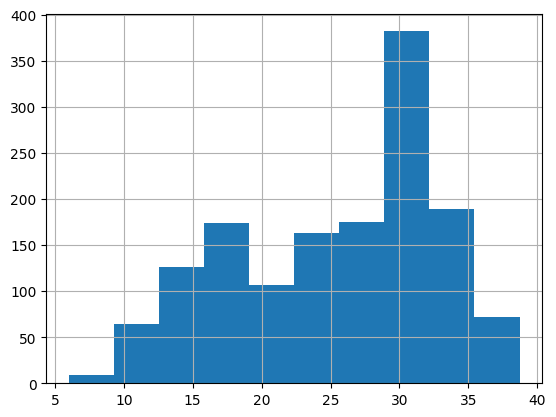

In [16]:
df_train['y'].hist()

In [18]:
df_train['y_orig'] = df_train['y']
df_train['y'] = np.log(df_train['y'])

In [19]:
df_train[['y','y_orig']]

,y,y_orig
0,2.302585,10.000000
1,2.001480,7.400000
2,1.969441,7.166667
3,2.159484,8.666667
4,1.791759,6.000000
...,...,...
1456,2.824351,16.850000
1457,2.845920,17.217391
1458,2.723799,15.238095
1459,2.645837,14.095238


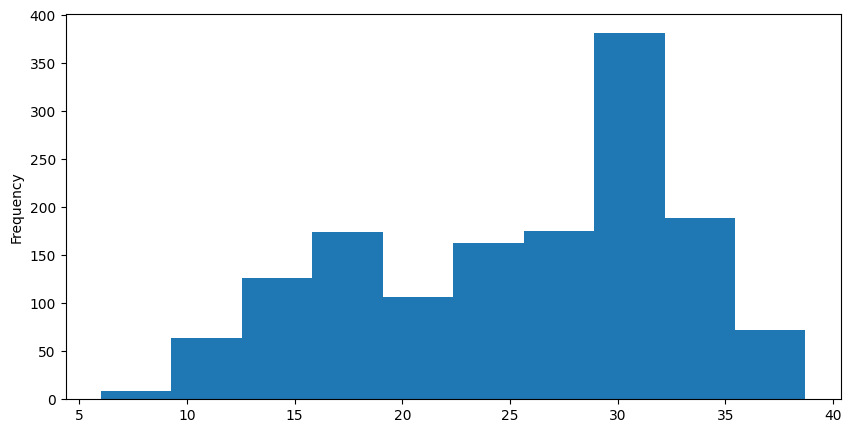

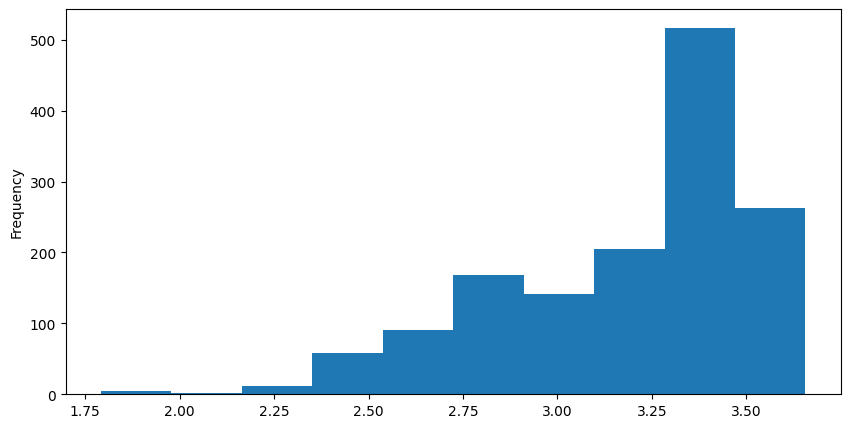

In [50]:
df_train['y_orig'].plot(kind='hist', figsize=(10,5))
plt.show()
df_train['y'].plot(kind='hist', figsize=(10,5))
plt.show()

array([<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
      dtype=object)

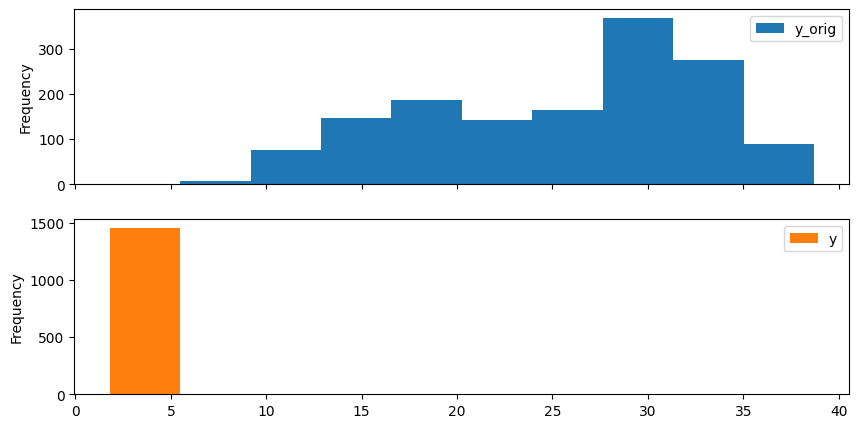

In [22]:
df_train[['y_orig','y']].plot(kind='hist', figsize=(10,5), subplots=True)

array([<Axes: ylabel='Density'>, <Axes: ylabel='Density'>], dtype=object)

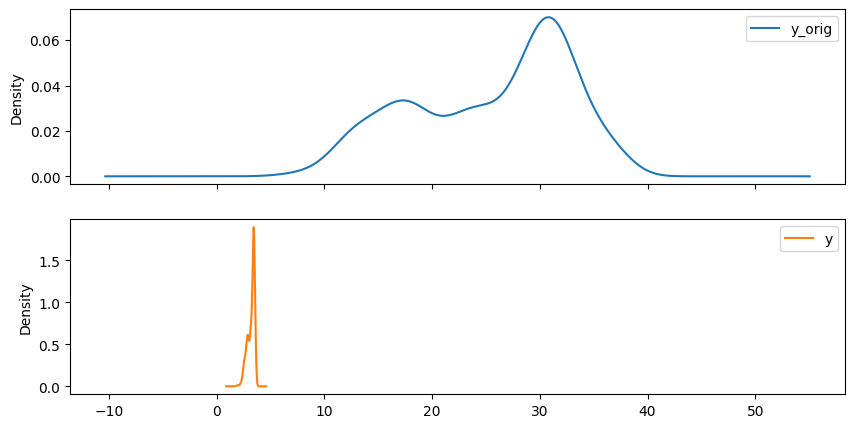

In [23]:
df_train[['y_orig','y']].plot(kind='kde', figsize=(10,5), subplots=True)

<Axes: >

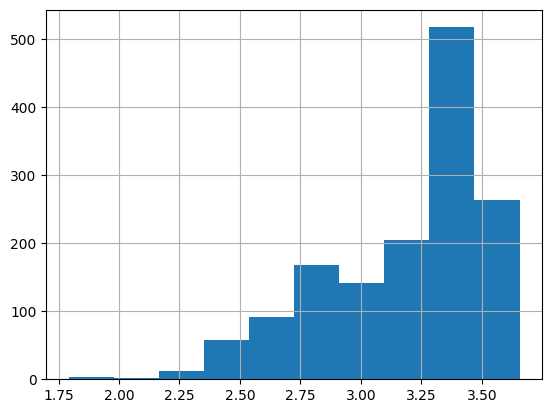

In [24]:
df_train['y'].hist()

In [25]:
from prophet import Prophet

In [ ]:
# in case if the library is not found/installed run the below statement
#!pip install prophet

In [26]:
model = Prophet(type='multiplicative')

In [27]:
df_train.head(1)

,ds,y,humidity,wind_speed,pressure,y_orig
0,2013-01-01,2.302585,84.5,0.0,1015.666667,10.0


In [28]:
model.fit(df_train)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpblr9bc3d/y1lp37aj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpblr9bc3d/vkxa3pto.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6863', 'data', 'file=/tmp/tmpblr9bc3d/y1lp37aj.json', 'init=/tmp/tmpblr9bc3d/vkxa3pto.json', 'output', 'file=/tmp/tmpblr9bc3d/prophet_model91ce8bch/prophet_model-20250104045030.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:50:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:50:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [36]:
df_train.tail(1)

,ds,y,humidity,wind_speed,pressure,y_orig
1460,2016-12-31,2.711553,87.0,7.325,1016.1,15.052632


In [30]:
future_data = model.make_future_dataframe(periods = 114, freq='D')

In [31]:
forecast_data = model.predict(future_data)

In [33]:
forecast_data[['ds','yhat']]

,ds,yhat
0,2013-01-01,2.392709
1,2013-01-02,2.398876
2,2013-01-03,2.399552
3,2013-01-04,2.402155
4,2013-01-05,2.402360
...,...,...
1570,2017-04-20,3.554441
1571,2017-04-21,3.558239
1572,2017-04-22,3.558540
1573,2017-04-23,3.559498


In [39]:
114-(31+28+31)

24

In [41]:
31+28+31+24

114

In [35]:
forecast_data.head(1)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,3.047856,2.278445,2.514375,3.047856,3.047856,-0.655147,-0.655147,-0.655147,0.003368,0.003368,0.003368,-0.658515,-0.658515,-0.658515,0.0,0.0,0.0,2.392709


In [42]:
forecast_data['ds'].max()

Timestamp('2017-04-24 00:00:00')

In [43]:
forecast_data['ds'].min()

Timestamp('2013-01-01 00:00:00')

<Axes: >

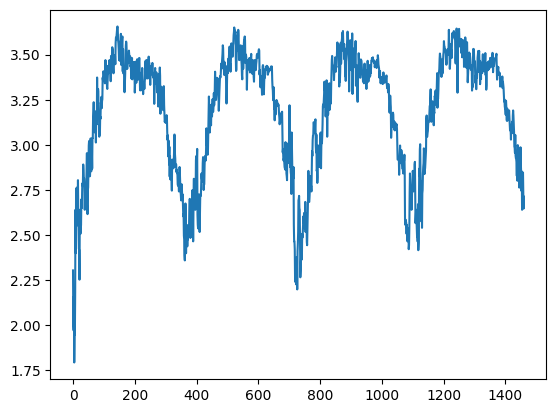

In [44]:
df_train['y'].plot()

<Axes: >

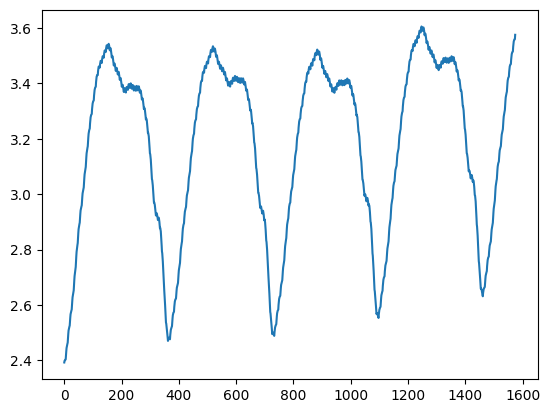

In [46]:
forecast_data['yhat'].plot()

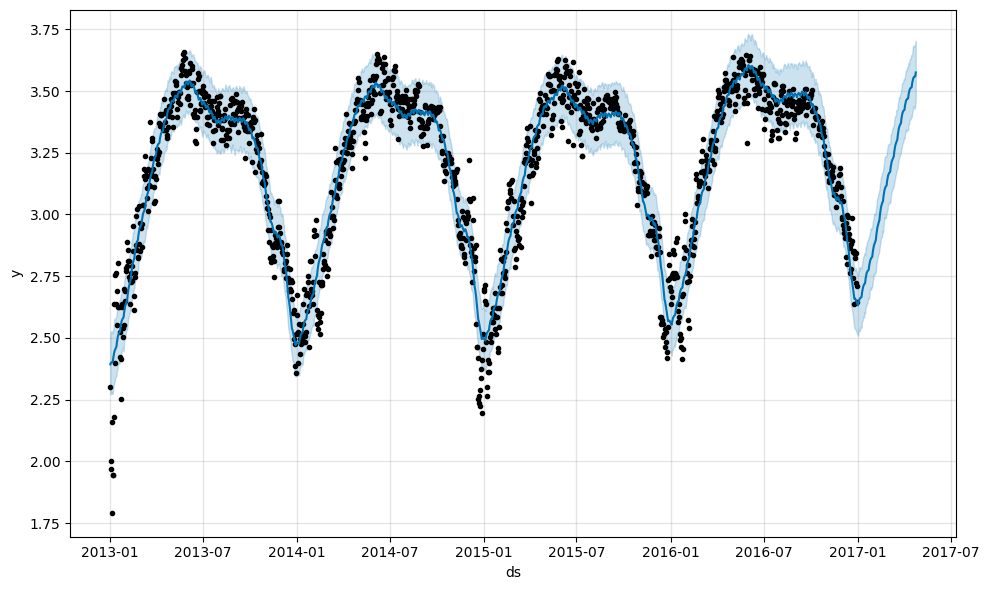

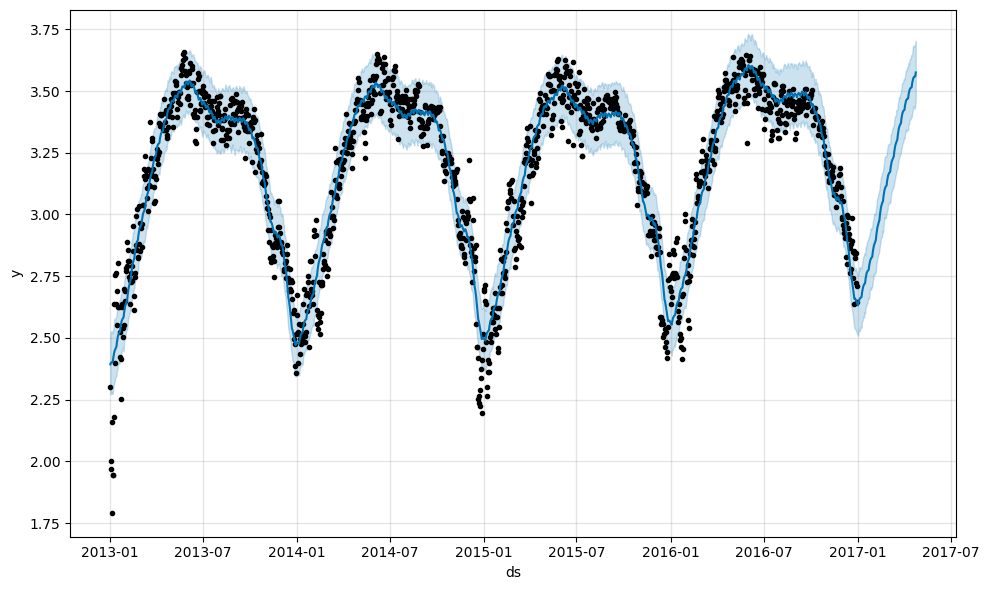

In [52]:
model.plot(forecast_data)

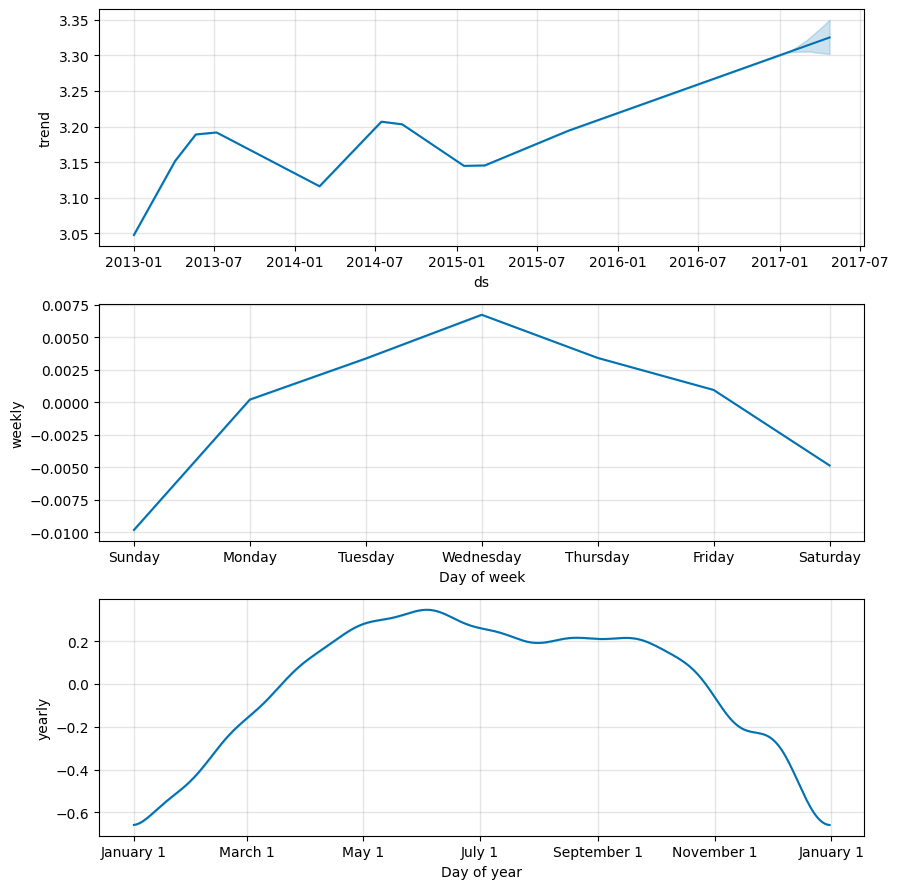

In [55]:
model.plot_components(forecast_data);

<Axes: >

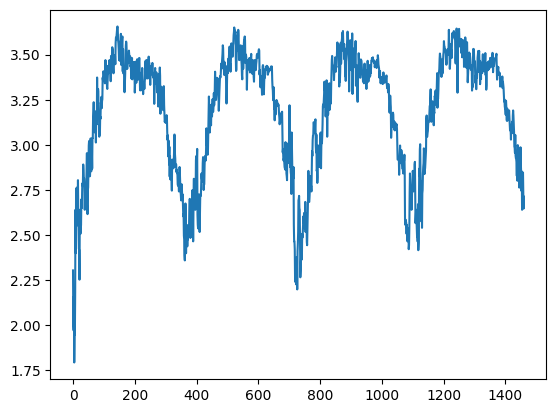

In [56]:

df_train['y'].plot()

<Axes: xlabel='ds'>

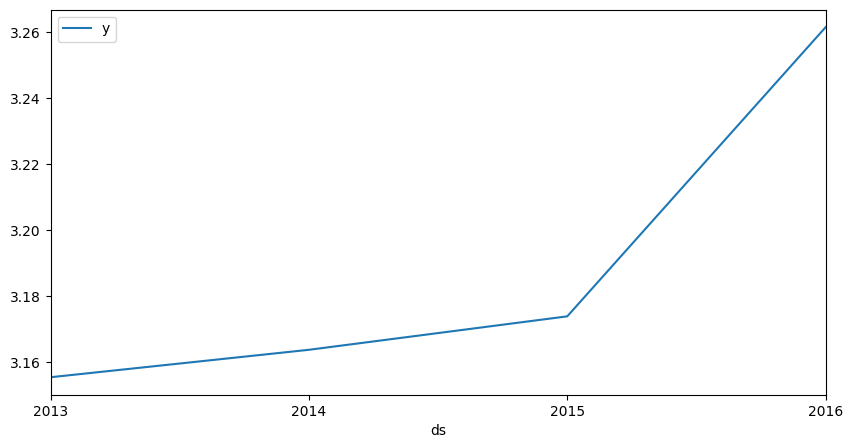

In [58]:
df_train_plot = df_train.copy()

df_train_plot.set_index('ds', inplace=True)

df_train_plot[['y']].resample('Y').mean().plot(figsize=(10,5))

<Axes: xlabel='ds'>

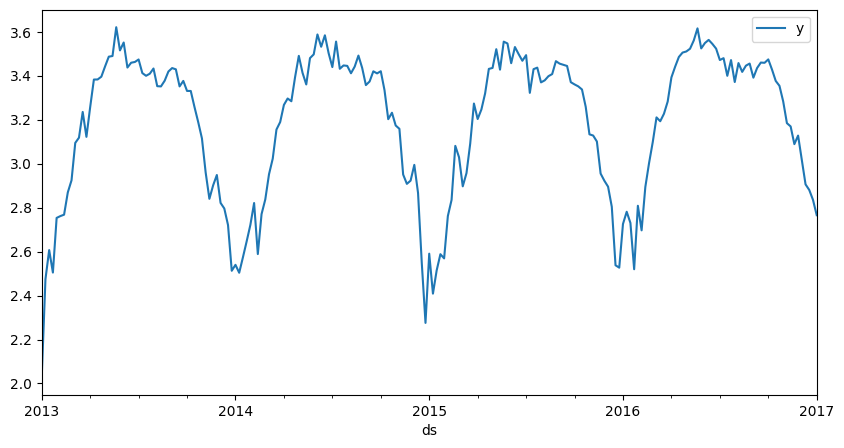

In [59]:
df_train_plot[['y']].resample('W').mean().plot(figsize=(10,5))

In [61]:
#df_train_plot.group [['y']].resample('W').mean().plot(figsize=(10,5)

<Axes: xlabel='ds'>

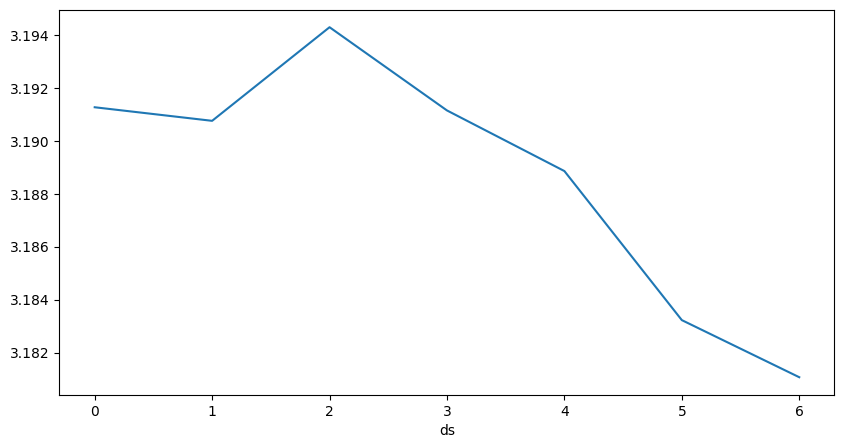

In [62]:
 df_train_plot.groupby(df_train_plot.index.day_of_week)['y'].mean().plot(figsize=(10,5))

<Axes: xlabel='ds'>

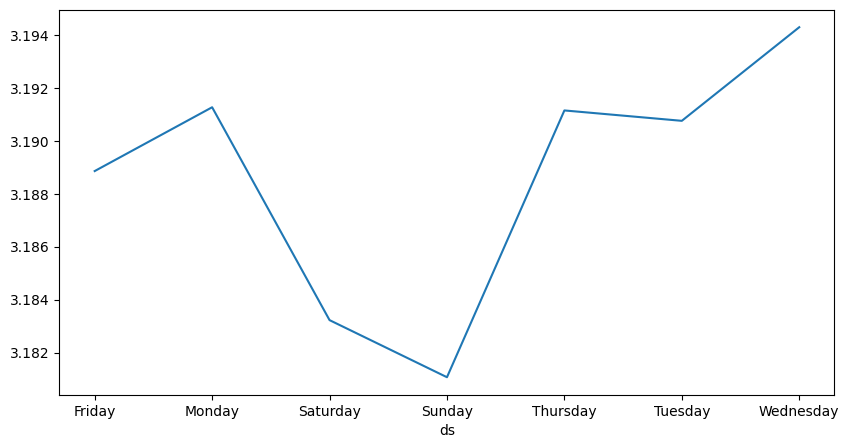

In [63]:
df_train_plot.groupby(df_train_plot.index.day_name())['y'].mean().plot(figsize=(10,5))

In [69]:
#df_train_plot.groupby(df_train_plot.index.day_name())['y'].mean().plot(figsize=(10,5))

In [66]:
df_train_plot.index[0:7].day_name()

Index(['Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday',
       'Monday'],
      dtype='object', name='ds')

In [68]:
df_train_plot.index[0:7].weekday

Index([1, 2, 3, 4, 5, 6, 0], dtype='int32', name='ds')

In [70]:
(df_train_plot.index[0:7].weekday + 1) % 7

Index([2, 3, 4, 5, 6, 0, 1], dtype='int32', name='ds')

In [71]:
(df_train_plot.index[0:15].weekday + 1) % 7

Index([2, 3, 4, 5, 6, 0, 1, 2, 3, 4, 5, 6, 0, 1, 2], dtype='int32', name='ds')

In [72]:
df_train_plot['week_day'] = (df_train_plot.index.weekday + 1) % 7

<Axes: xlabel='week_day'>

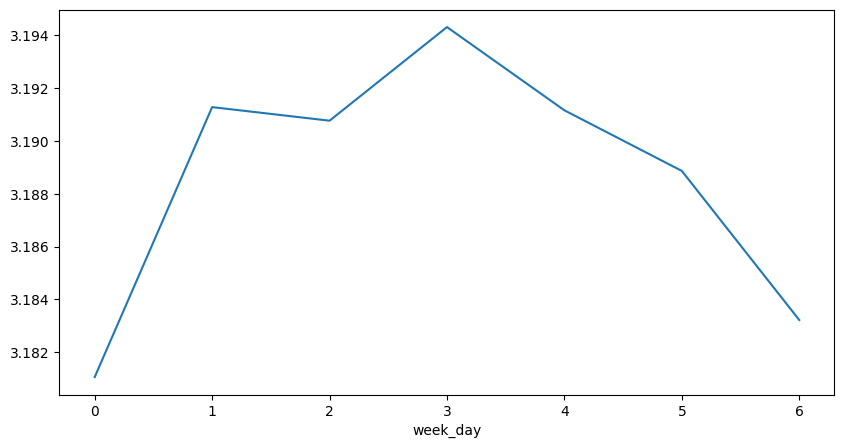

In [73]:
df_train_plot.groupby(df_train_plot.week_day)['y'].mean().plot(figsize=(10,5))

In [74]:
forecast_data['yhat']

,yhat
0,2.392709
1,2.398876
2,2.399552
3,2.402155
4,2.402360
...,...
1570,3.554441
1571,3.558239
1572,3.558540
1573,3.559498


In [75]:
forecast_data_orig = forecast_data.copy()
forecast_data_orig['yhat'] = np.exp(forecast_data_orig['yhat'])


In [76]:
forecast_data_orig['yhat'].head(1), forecast_data['yhat'].head(1)

(0    10.9431
 Name: yhat, dtype: float64,
 0    2.392709
 Name: yhat, dtype: float64)

In [77]:
df_train.head(1)

,ds,y,humidity,wind_speed,pressure,y_orig
0,2013-01-01,2.302585,84.5,0.0,1015.666667,10.0


In [79]:
final_df = pd.DataFrame(forecast_data_orig)

import plotly.graph_objects as go
import plotly.offline as py

ac = go.Scatter(x = df_train['ds'], y=df_train['y_orig'], name='actual')
pc = go.Scatter(x = final_df['ds'], y=final_df['yhat'], name='prediccteed')

py.plot([ac, pc])




'temp-plot.html'

In [82]:
%%html
<a href="/content/temp-plot.html"> link </a>



In [85]:
import IPython
IPython.display.HTML(filename='/content/temp-plot.html')


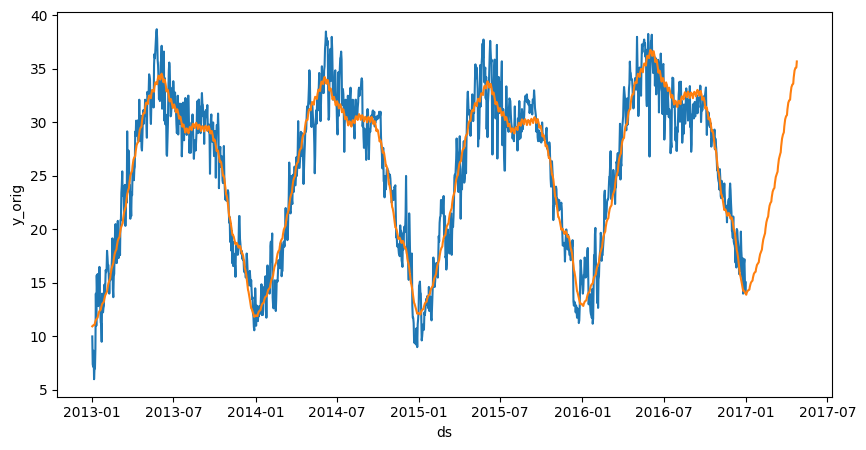

In [87]:
plt.figure(figsize=(10,5))
sns.lineplot(data=df_train, x='ds', y='y_orig')
sns.lineplot(data=forecast_data_orig, x='ds', y='yhat')
plt.show()

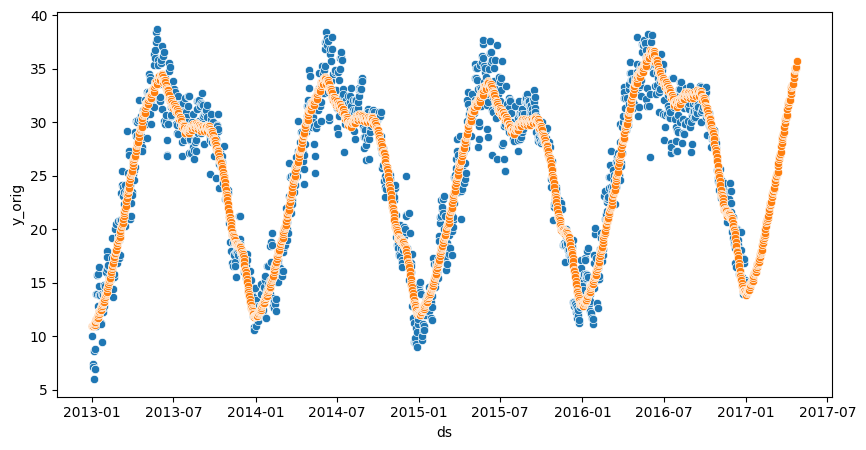

In [88]:
plt.figure(figsize=(10,5))
sns.scatterplot(data=df_train, x='ds', y='y_orig')
sns.scatterplot(data=forecast_data_orig, x='ds', y='yhat')
plt.show()

In [91]:
forecast_data_orig[['ds','yhat']].tail(114)

,ds,yhat
1461,2017-01-01,13.896723
1462,2017-01-02,14.063637
1463,2017-01-03,14.151935
1464,2017-01-04,14.259041
1465,2017-01-05,14.284767
...,...,...
1570,2017-04-20,34.968250
1571,2017-04-21,35.101346
1572,2017-04-22,35.111907
1573,2017-04-23,35.145563


In [92]:
forecast_data_orig[['ds','yhat']].iloc[:-114]

,ds,yhat
0,2013-01-01,10.943100
1,2013-01-02,11.010796
2,2013-01-03,11.018241
3,2013-01-04,11.046960
4,2013-01-05,11.049227
...,...,...
1456,2016-12-27,14.246347
1457,2016-12-28,14.217550
1458,2016-12-29,14.116572
1459,2016-12-30,14.049891


In [94]:
from sklearn.metrics import mean_squared_error, root_mean_squared_error

#rmse = np.sqrt(mean_squared_error(df_train['y_orig'], forecast_data_orig['yhat']))

#(mean_squared_error(df_train['y_orig'], forecast_data_orig['yhat'], squared=False))

rsmse = root_mean_squared_error(df_train['y_orig'], forecast_data_orig['yhat'].iloc[:-114])
print('Train RMSE:', rsmse)




Train RMSE: 2.021426457739961


In [111]:
# loading the data files
#del o2train
#del o2test
o2train = pd.read_csv('/content/Temperature1_Train.csv')
o2test = pd.read_csv('/content/Temperature1_Test.csv')


o2train['date'] = pd.to_datetime(o2train['date'], format='%d/%m/%Y')
o2test['date'] = pd.to_datetime(o2test['date'], format='%d/%m/%Y')

o2train = o2train.rename(columns={'temp':'y', 'date':'ds'})
o2test = o2test.rename(columns={'temp':'y', 'date':'ds'})

o2train['y_orig'] = o2train['y']
o2train['y'] = np.log(o2train['y'])

o2test['y_orig'] = o2test['y']

In [112]:
o2train.head(1)

,ds,y,humidity,wind_speed,pressure,y_orig
0,2013-01-01,2.302585,84.5,0.0,1015.666667,10.0


In [113]:
model_mts = Prophet()
model_mts.add_regressor('humidity')
model_mts.add_regressor('wind_speed')
model_mts.add_regressor('pressure')

In [114]:
model_mts.fit(o2train)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpblr9bc3d/nag6ma4h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpblr9bc3d/pxlfkeaz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53681', 'data', 'file=/tmp/tmpblr9bc3d/nag6ma4h.json', 'init=/tmp/tmpblr9bc3d/pxlfkeaz.json', 'output', 'file=/tmp/tmpblr9bc3d/prophet_modelqxnj9_ih/prophet_model-20250104065805.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:58:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:58:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [115]:
ofuturee = model_mts.make_future_dataframe(periods = 114, freq='D')
ofuturee.head(1), ofuturee.tail(1)

(          ds
 0 2013-01-01,
              ds
 1574 2017-04-24)

In [116]:
o2train.index

RangeIndex(start=0, stop=1461, step=1)

In [117]:
otest.index

RangeIndex(start=0, stop=114, step=1)

In [118]:

o2train = pd.concat([o2train, o2test], ignore_index=True)
#o2train = pd.concat([o2train.reset_index(drop=True),
#                     o2test.reset_index(drop=True)], ignore_index=True)
#The .reset_index(drop=True) method is used to reset the index of both DataFrames o2train and o2test to a default, sequential index (0, 1, 2, ...). The drop=True argument ensures that the original index is not kept as a new column in the DataFrames.


o2train = o2train.rename(columns={'temp':'y', 'date':'ds'})
ofuture = o2train[['ds', 'humidity', 'wind_speed', 'pressure']]
ofuture

,ds,humidity,wind_speed,pressure
0,2013-01-01,84.500000,0.000000,1015.666667
1,2013-01-02,92.000000,2.980000,1017.800000
2,2013-01-03,87.000000,4.633333,1018.666667
3,2013-01-04,71.333333,1.233333,1017.166667
4,2013-01-05,86.833333,3.700000,1016.500000
...,...,...,...,...
1570,2017-04-20,27.500000,5.562500,998.625000
1571,2017-04-21,39.375000,6.962500,999.875000
1572,2017-04-22,40.900000,8.890000,1001.600000
1573,2017-04-23,27.500000,9.962500,1002.125000


In [119]:
oforecast_data = model_mts.predict(ofuture)


In [120]:
oforecast_data[['ds','yhat']].tail(5)


,ds,yhat
1570,2017-04-20,3.576145
1571,2017-04-21,3.525185
1572,2017-04-22,3.521095
1573,2017-04-23,3.581012
1574,2017-04-24,3.590878


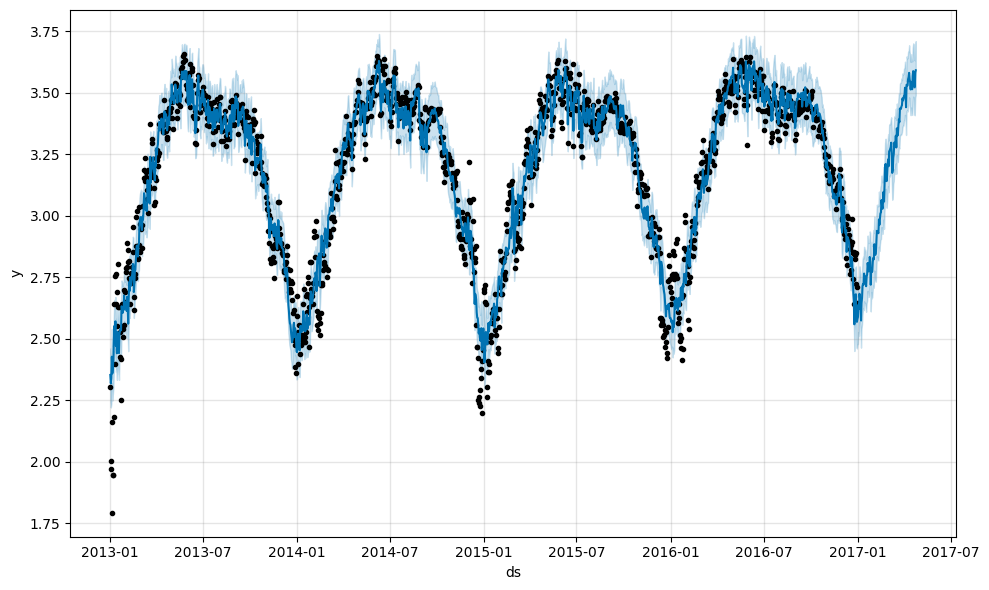

In [122]:
model_mts.plot(oforecast_data);

In [123]:
oforecast_data_orig = oforecast_data.copy()

In [124]:
oforecast_data_orig['yhat'] = np.exp(oforecast_data_orig['yhat'])

In [128]:
oforecast_data_orig['yhat'].head(1)

,yhat
0,10.50739


In [135]:
o2train.head(1)

,ds,y,humidity,wind_speed,pressure,y_orig,y_log
0,2013-01-01,10.0,84.5,0.0,1015.666667,10.0,2.302585


In [126]:
o2train['y_log'] = o2train['y']
o2train['y'] = o2train['y_orig']


In [133]:
ofinal_df = pd.DataFrame(oforecast_data_orig)

#import plotly.graph_objects as go
#import plotly.offline as py

oac = go.Scatter(x = o2train['ds'], y=o2train['y_orig'], name='actual')
opc = go.Scatter(x = ofinal_df['ds'], y=ofinal_df['yhat'], name='prediccteed')

py.plot([oac, opc], filename='mts.html')




'mts.html'

In [132]:
IPython.display.HTML(filename='temp-plot.html')

In [134]:
IPython.display.HTML(filename='mts.html')